В рамках этой обзорной работы, была поставлена цель оценить перспективы применения методов "machine vision" или "Традиционных методов компьютерногозрения"
как предобработки для последующего высокоэффективного нахождения более сложных паттернов и обьектов.

    1. Было обнаруженны ограничения детекторов границ.
    
    2. При анализе полученных результатов возникла идея написания своего улучшенного "детектора границ" 
    
    (планируеться после изучения детекторов которых невключены в OpenCV, таких как: 
    
        EDLines (Edge Drawing Lines)
        ACF (Attraction Field Convolution Filter)
        ELSD (Ellipse and Line Segment Detector)
        FLED (Fast Line Extractor using Directional masks)
        RANSAC (Random Sample Consensus)
        EDCircles
        Wavelet-Based Edge Detection
        и др.
        (не вошли в работу)
    ).
    
Применялись различные фильтры, шумы, и сами функции выявления границ.

Размер изображения: (512, 768, 3)
Минимальное значение градиента: 0
Максимальное значение градиента: 255
Минимальное значение градиента: 0
Максимальное значение градиента: 255


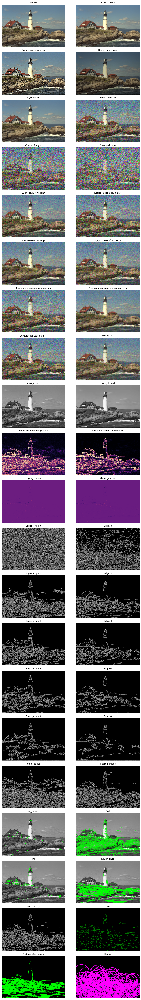

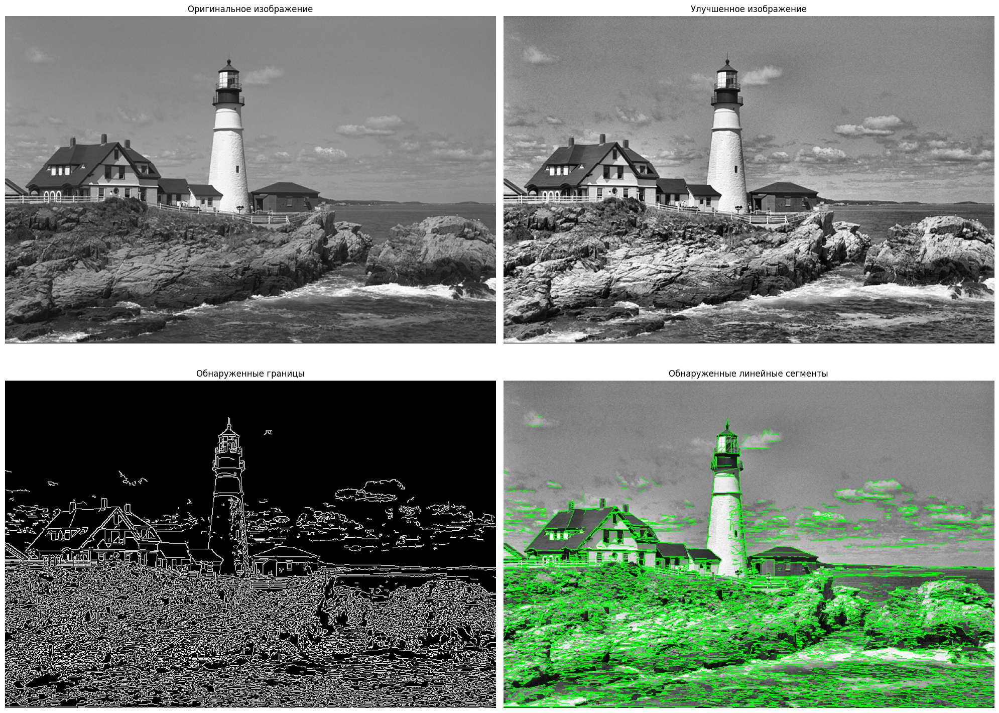

In [1]:
import cv2
import numpy as np
image = cv2.imread('../data/kodim21.png')
print(f"Размер изображения: {image.shape}")
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

import showimg
images = {}

import blur
blured = blur.gauss(image_rgb)
blur.show_all_methods(image_rgb, images)

import noise
blured_noised = noise.combination(blured)
noise.show_all_methods(blured, images)

#*************************************************************
import filter_matrix
filter_matrix.show_all_methods(blured_noised, images)
#blured_noised_blured = cv2.GaussianBlur(blured_noised, (5, 5), 1.5)
#non_local = filter_matrix.non_local_means_filter(blured_noised_blured)

#origin_blured = cv2.GaussianBlur(image_rgb, (5, 5), 1.5)
non_local = filter_matrix.non_local_means_filter(image_rgb)

gray_origin = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2GRAY)
gray_filtered = cv2.cvtColor(non_local, cv2.COLOR_BGR2GRAY)

#сравнение идеала и восстановленого
images.update({
    'gray_origin': gray_origin,
    'gray_filtered': gray_filtered
})


import grad
images.update({ 
    'origin_gradient_magnitude': grad.magnitude(gray_origin),
    'filtered_gradient_magnitude': grad.magnitude(gray_filtered)
})

import corner
images.update({ 
    'origin_corners':corner.harris(gray_origin),
    'filtered_corners':corner.harris(gray_filtered)
})

import edge
edge.show_canny_comparision(gray_origin, gray_filtered, images)
images.update({ 
    'origin_edges': cv2.Canny(gray_origin, 0, 100),
    'filtered_edges': cv2.Canny(gray_filtered, 0, 25)
})
img = gray_origin
images.update({ 
    'shi_tomasi': edge.apply_shi_tomasi(img),
    'fast': edge.apply_fast(img),
    'orb': edge.apply_orb(img),
    'hough_lines': edge.apply_hough_lines(img)
})
images.update({ 
    'Auto Canny': edge.auto_canny(img),
    'LSD': edge.apply_lsd(img),
    'Probabilistic Hough': edge.apply_probabilistic_hough(img),
    'Circles': edge.detect_circles(img)
})

showimg.show_images(images)

enhanced, binary = edge.preprocess_image(img)
edges = edge.detect_edges(enhanced)
lines = edge.detect_line_segments(enhanced, edges)
result = edge.draw_lines(enhanced, lines)

# Отображение результатов
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 15))
plt.subplot(221), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Оригинальное изображение'), plt.axis('off')
plt.subplot(222), plt.imshow(enhanced, cmap='gray')
plt.title('Улучшенное изображение'), plt.axis('off')
plt.subplot(223), plt.imshow(edges, cmap='gray')
plt.title('Обнаруженные границы'), plt.axis('off')
plt.subplot(224), plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Обнаруженные линейные сегменты'), plt.axis('off')
plt.tight_layout()
plt.show()